In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_C2-3.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 10342 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 519 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

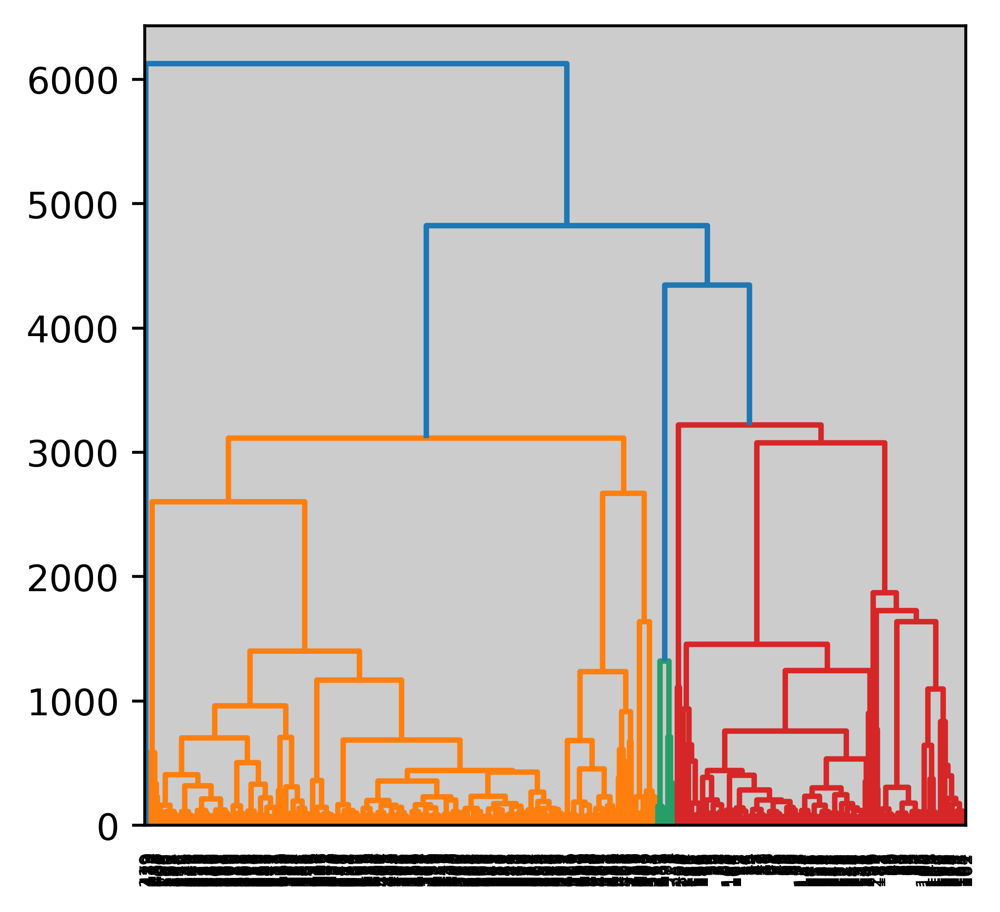

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 519 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=50, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[45  4 33 39 14 14 14 14 41 35 31 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 30 13 13 13 13 13 13 13 13  9 13 13 13 13 13 13 13 13 13 13
 28 38 38 38 38 13 13 13 13 13 13 13 13 13 13 38 38 38 38 38 38 38 38 38
 38  9 13 13 13 13 13 38 38 38 38 38 38 38 38 38 38 13 13 13 38 38 38 13
 13 11 13 11 11 18 13 11 18 13 13 11 18 18 13 18 13 13 13 13 13 13 13 32
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 42 13 13 13 13 13 46 13
 13 13 13 13 13 13 13 13 13 36 13 24 13 13 24 13 24 24 24 24 24  3 47 24
 24  3 22 24 24 24 24 44 27 40  7  7  7  7  7  7  7 17  7  2  2  2  2 43
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2 29  2  2  2  2  2  2 21  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  6
  2  2  2  2  2  6  2  2  2  2  6  6  2  2  2  2 25  2  2  2  2  2  2  2
  2  2  6  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  6  6  2  2  2  2  2  2  2  2  2  2  2 37  6  2

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_2736254/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

2     238
13    102
8      30
38     27
24     13
23     13
5       8
6       8
7       8
4       6
11      5
18      5
14      4
1       4
12      4
16      3
10      3
0       3
48      2
9       2
3       2
41      1
36      1
37      1
39      1
40      1
47      1
42      1
43      1
44      1
45      1
46      1
34      1
35      1
25      1
33      1
32      1
31      1
30      1
29      1
28      1
27      1
26      1
22      1
21      1
20      1
19      1
17      1
15      1
49      1
Name: SMC_clusters, dtype: int64

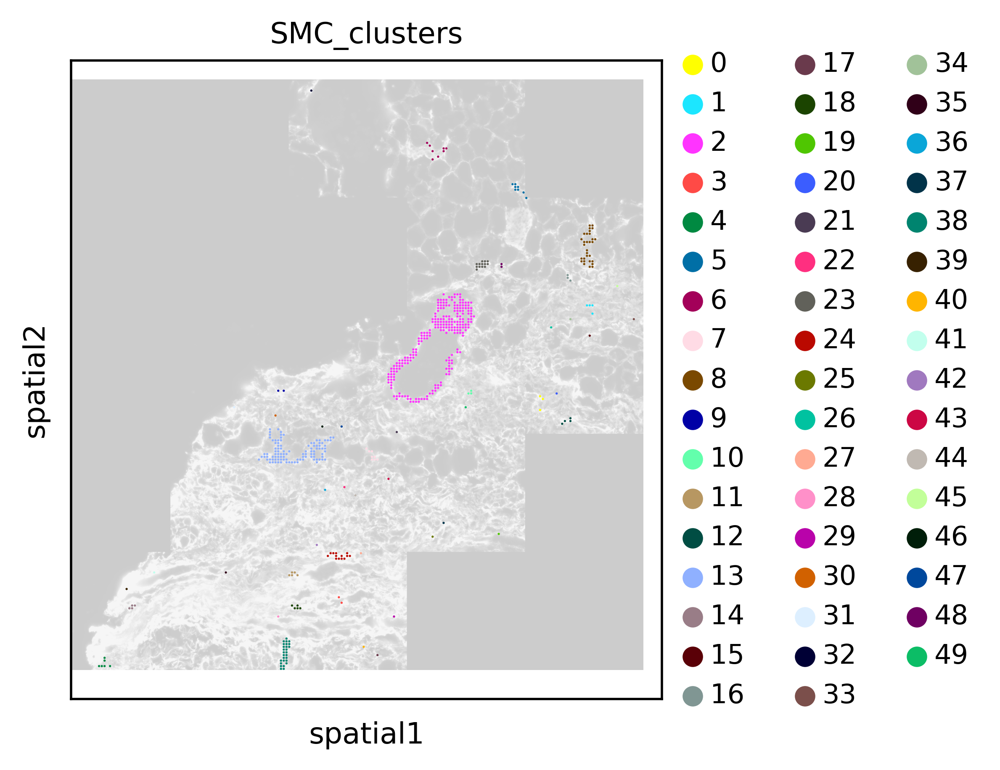

In [17]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

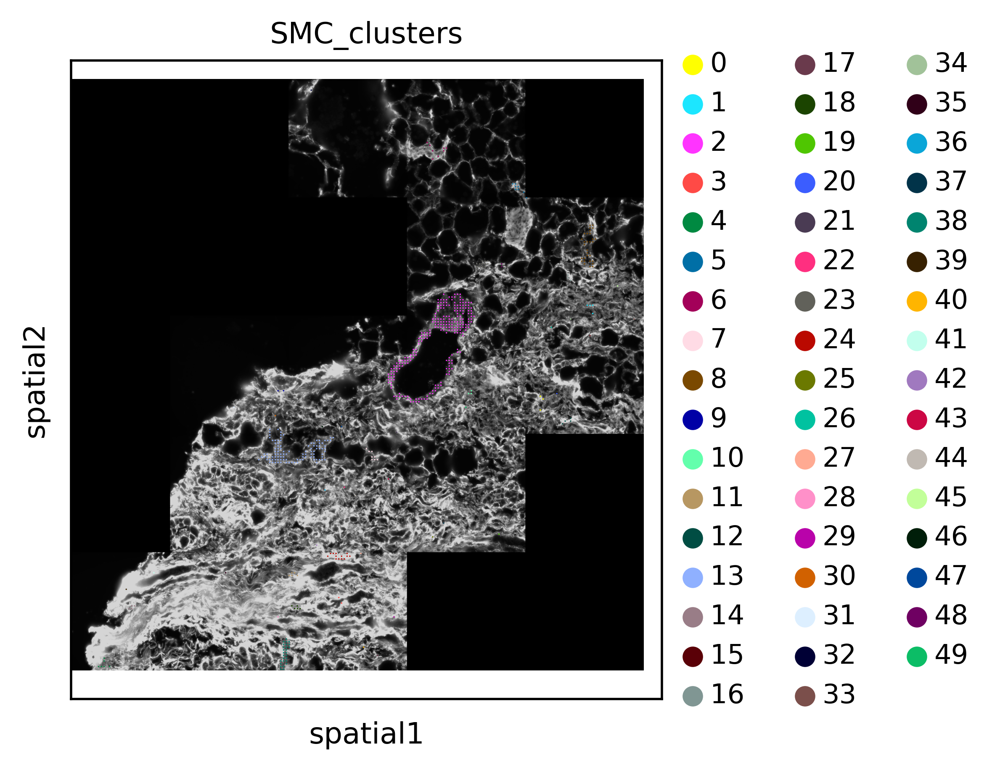

In [18]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=5, alpha_img = 1)

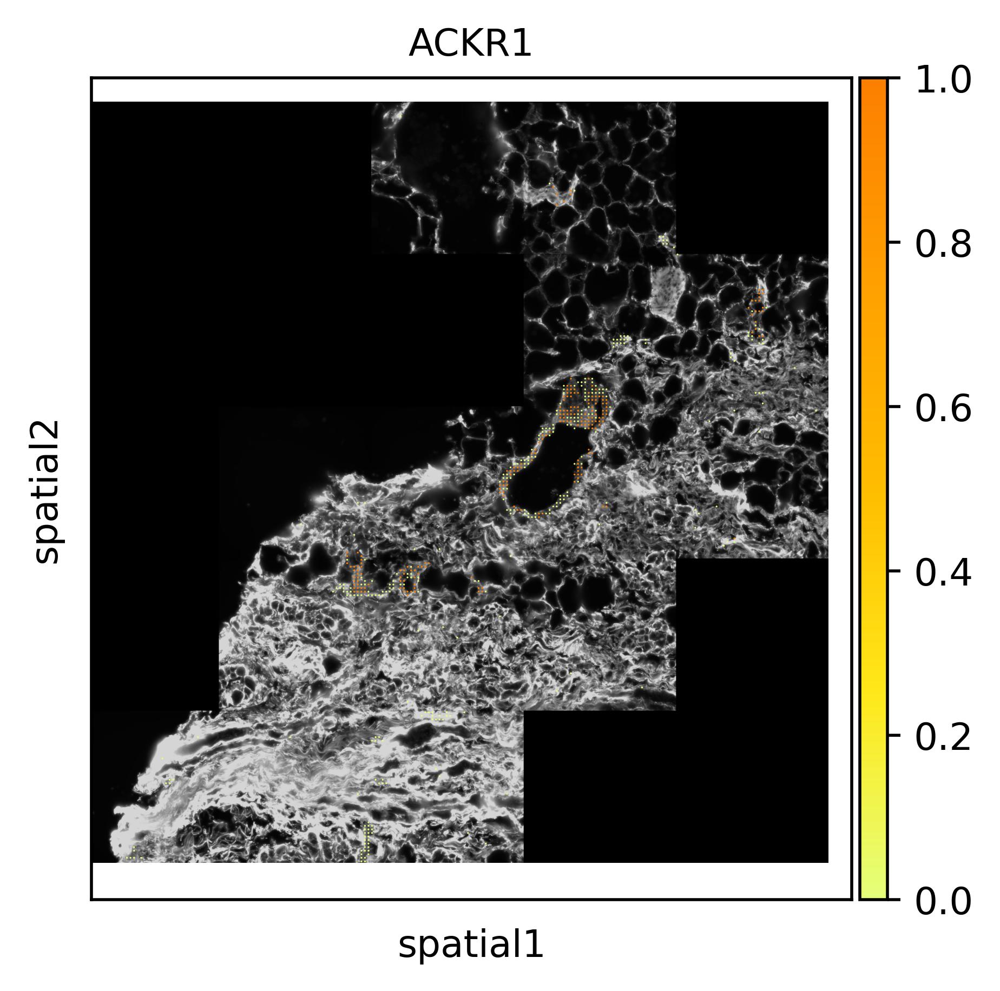

In [19]:
#99
sc.pl.spatial(adata_aec,
              color="ACKR1",img_key='WGA',size=5, alpha_img = 1, cmap = 'Wistia', vmax = 1)

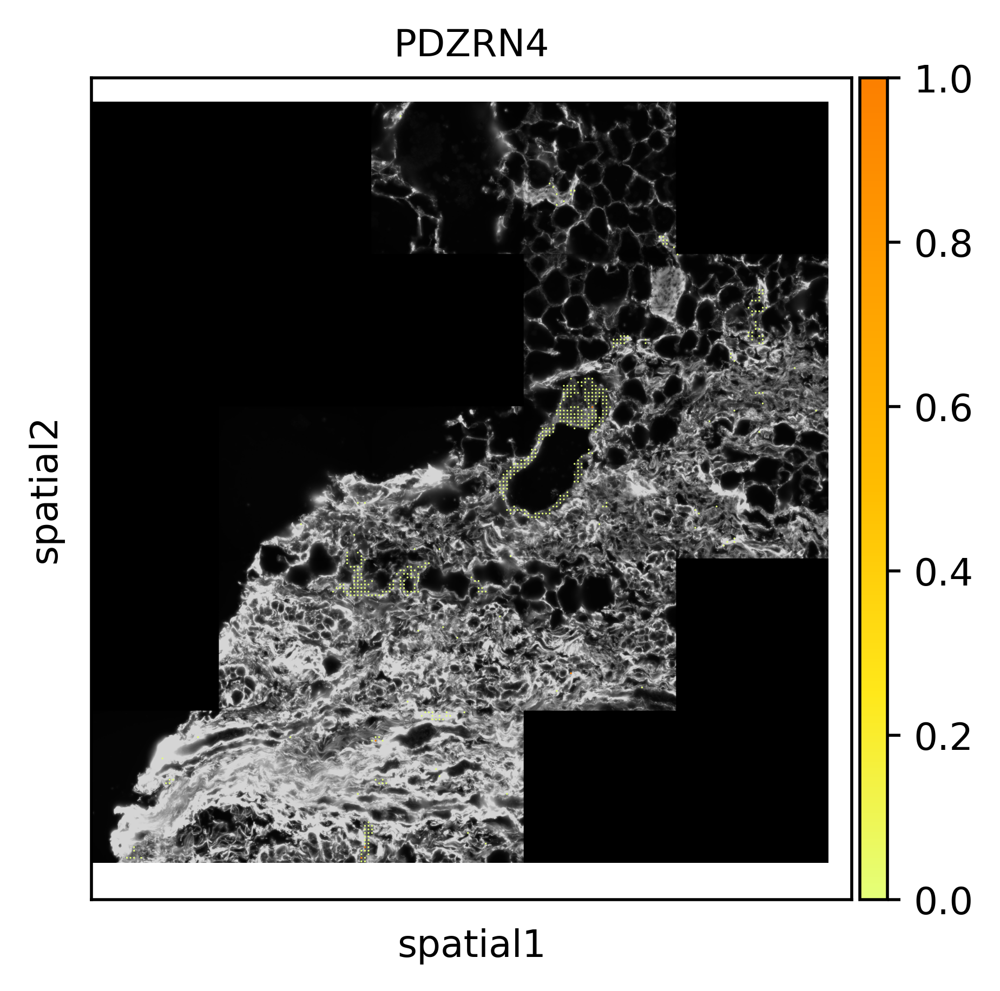

In [20]:
#99
sc.pl.spatial(adata_aec,
              color="PDZRN4",img_key='WGA',size=5, alpha_img = 1, cmap = 'Wistia', vmax = 1)

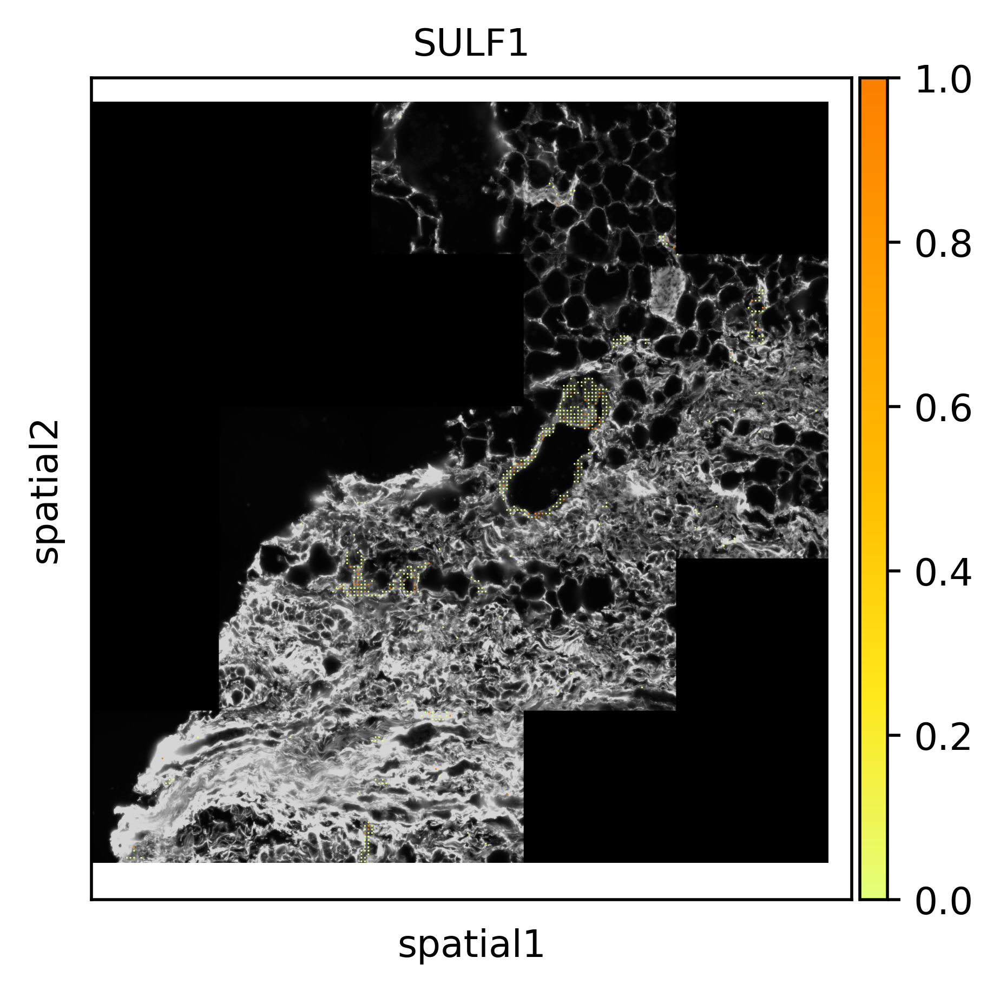

In [21]:
#99
sc.pl.spatial(adata_aec,
              color="SULF1",img_key='WGA',size=5, alpha_img = 1, cmap = 'Wistia', vmax = 1)

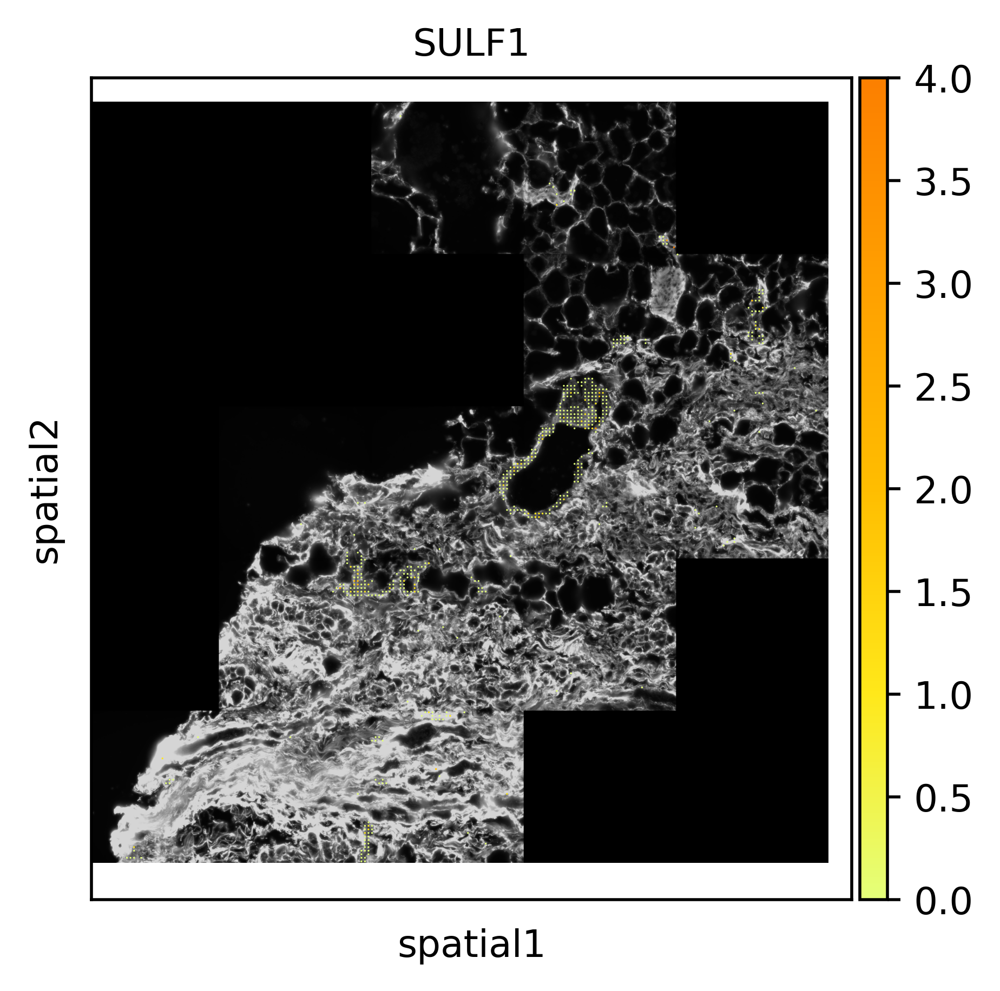

In [22]:
#99
sc.pl.spatial(adata_aec,
              color="SULF1",img_key='WGA',size=5, alpha_img = 1, cmap = 'Wistia')

In [23]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[2, 13, 8, 38, 24, 23, 5, 6, 7, 4]

In [24]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [25]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [26]:
adata_aec_subset

AnnData object with n_obs × n_vars = 453 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [27]:
#del adata_aec_subset.uns['SMC_clusters_colors']

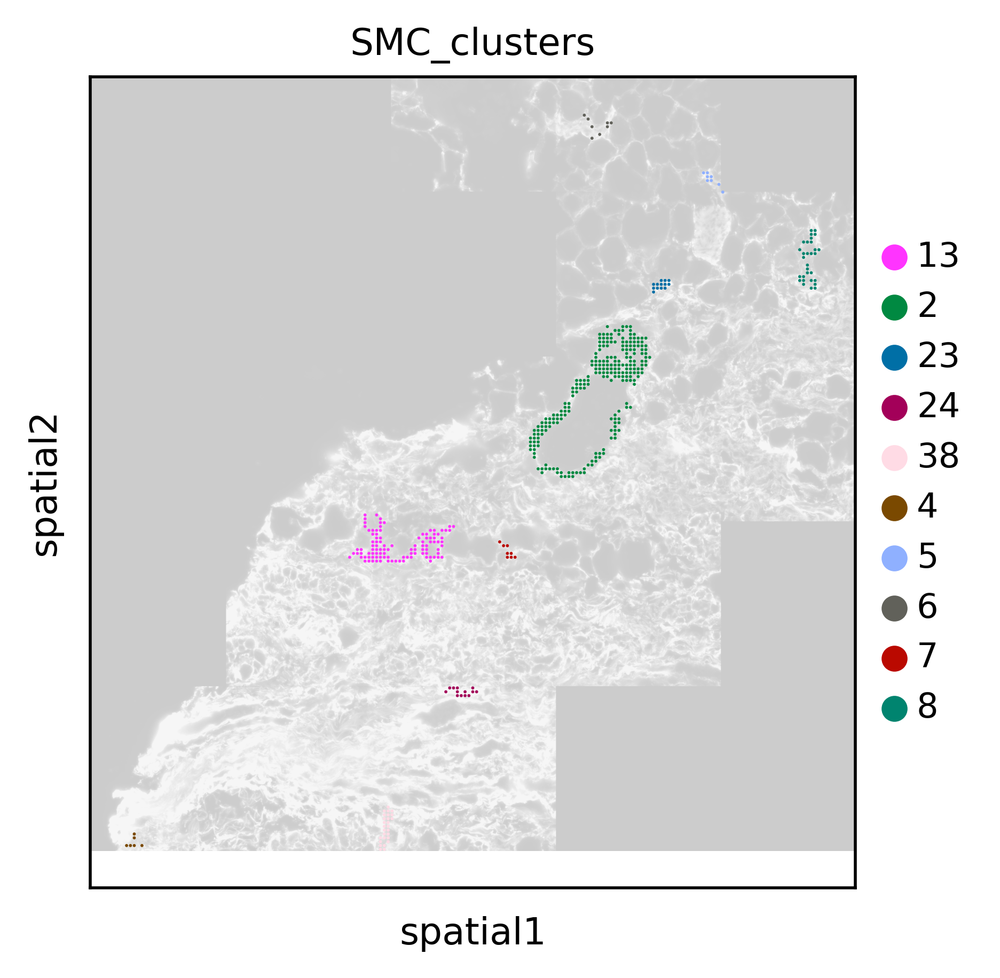

In [28]:
#99
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

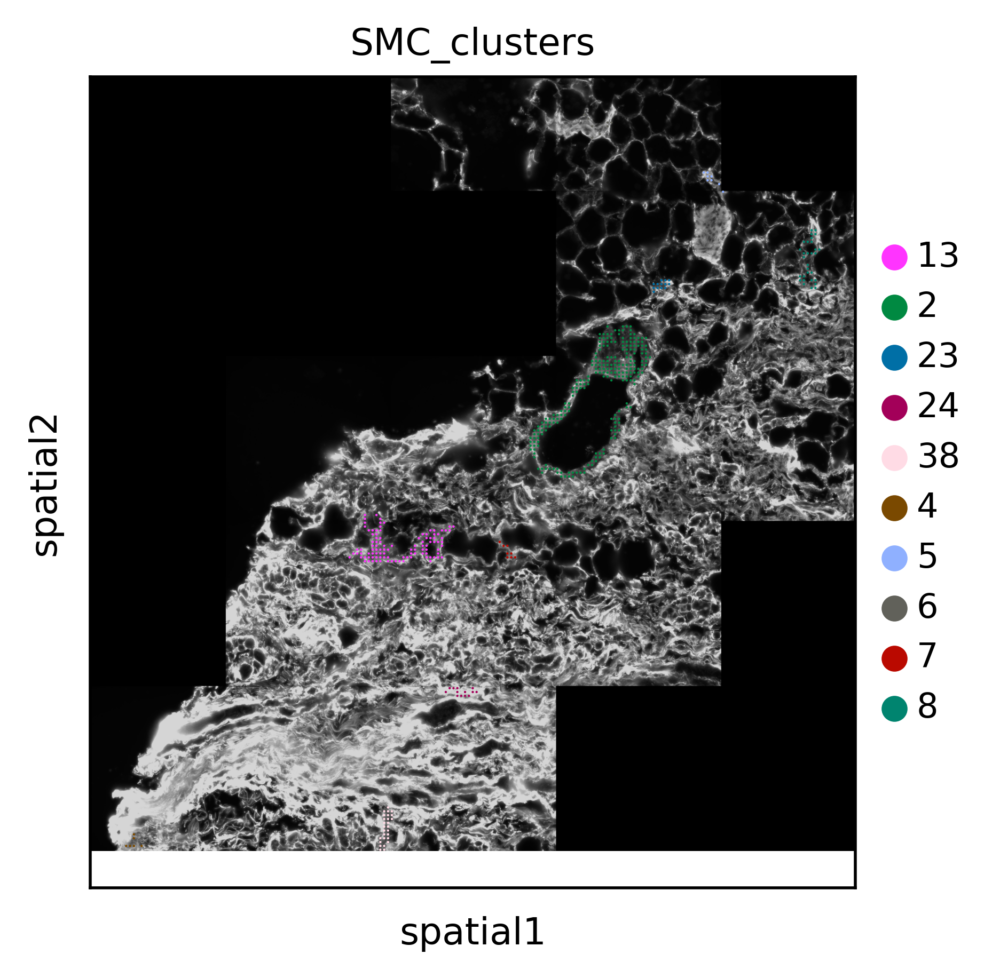

In [29]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

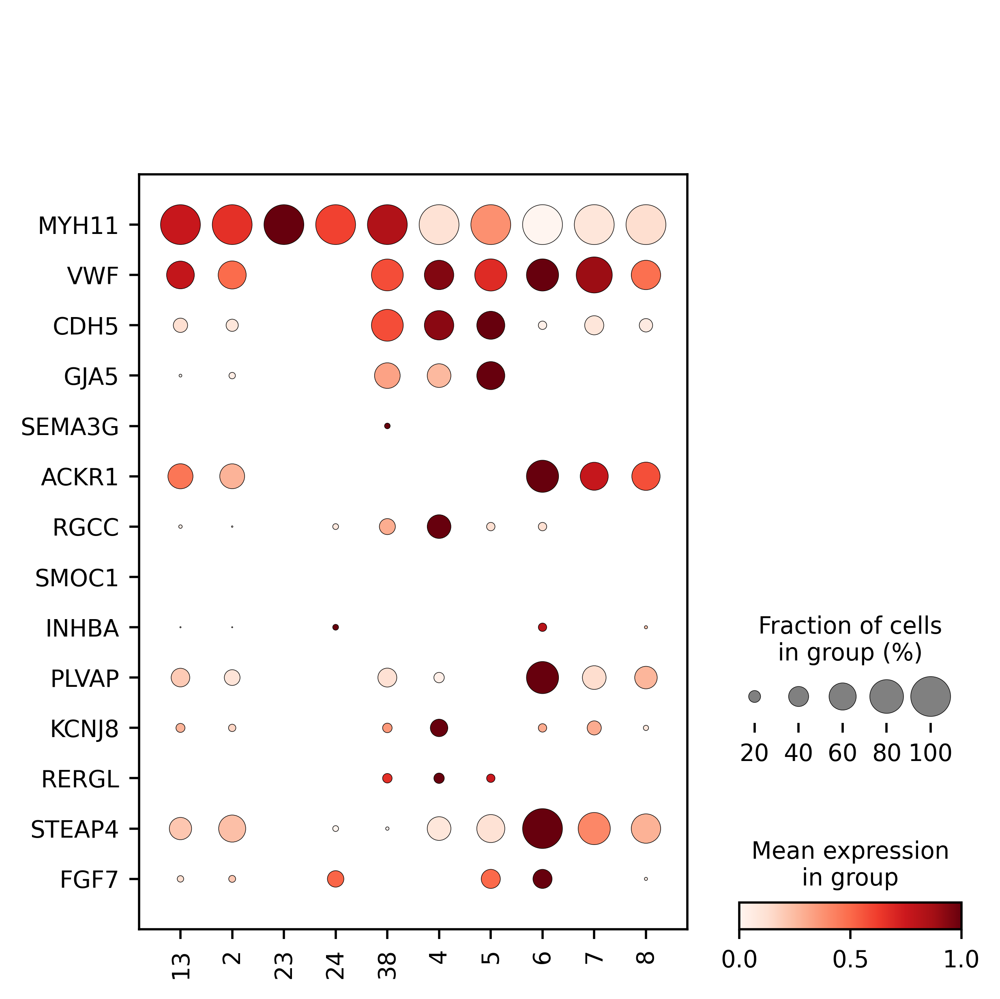

In [30]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [31]:
# add gene percentage expressed to dataframe

In [32]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [33]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [34]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [35]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [36]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [37]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [38]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [39]:
adata_aec_subset

AnnData object with n_obs × n_vars = 453 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [40]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [41]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000


In [42]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [43]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [44]:
matrix2 = matrix.replace(0, np.NaN)

In [45]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [46]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
13,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN
2,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN
23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN
38,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN
4,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN
5,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN
6,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN
7,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN


### add expression values to dataframe

In [47]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [48]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN


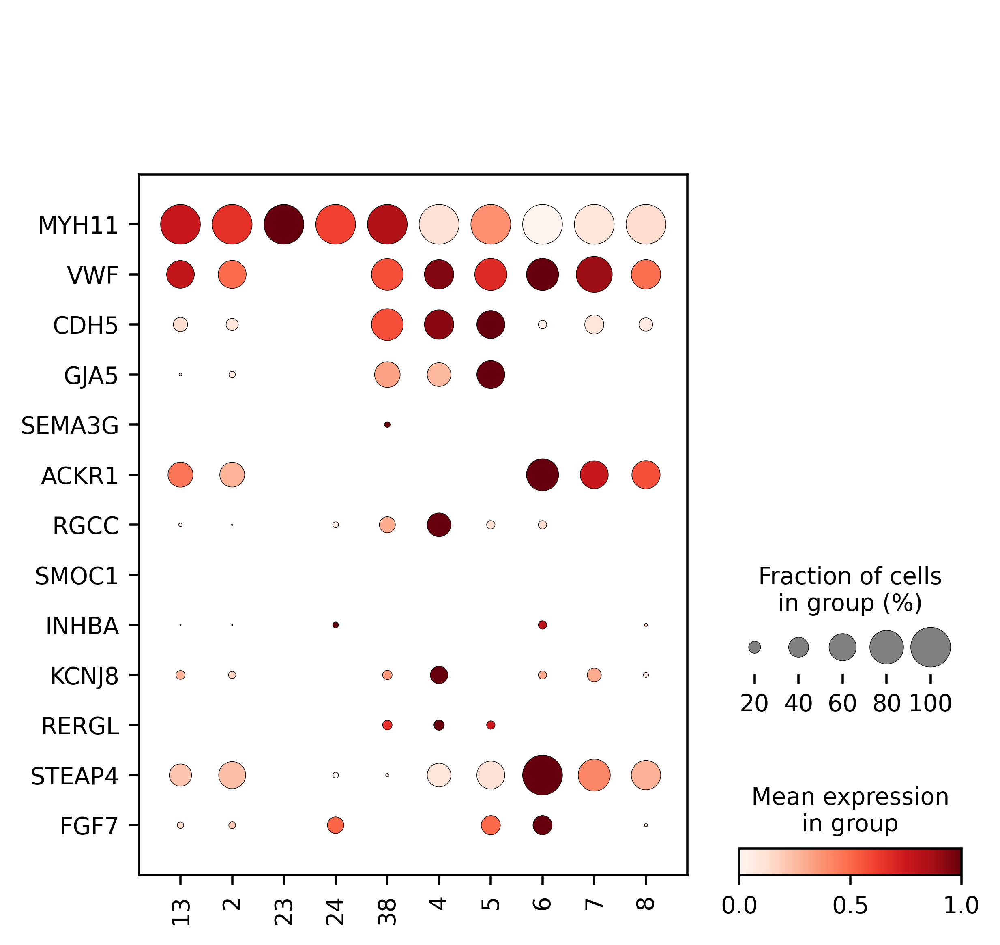

In [49]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [50]:
#add vessel type annotation column

In [51]:
test["Vessel"] = ['Vein','Vein','Unclear','Unclear','Artery','Artery','Artery','Vein','Vein','Vein']

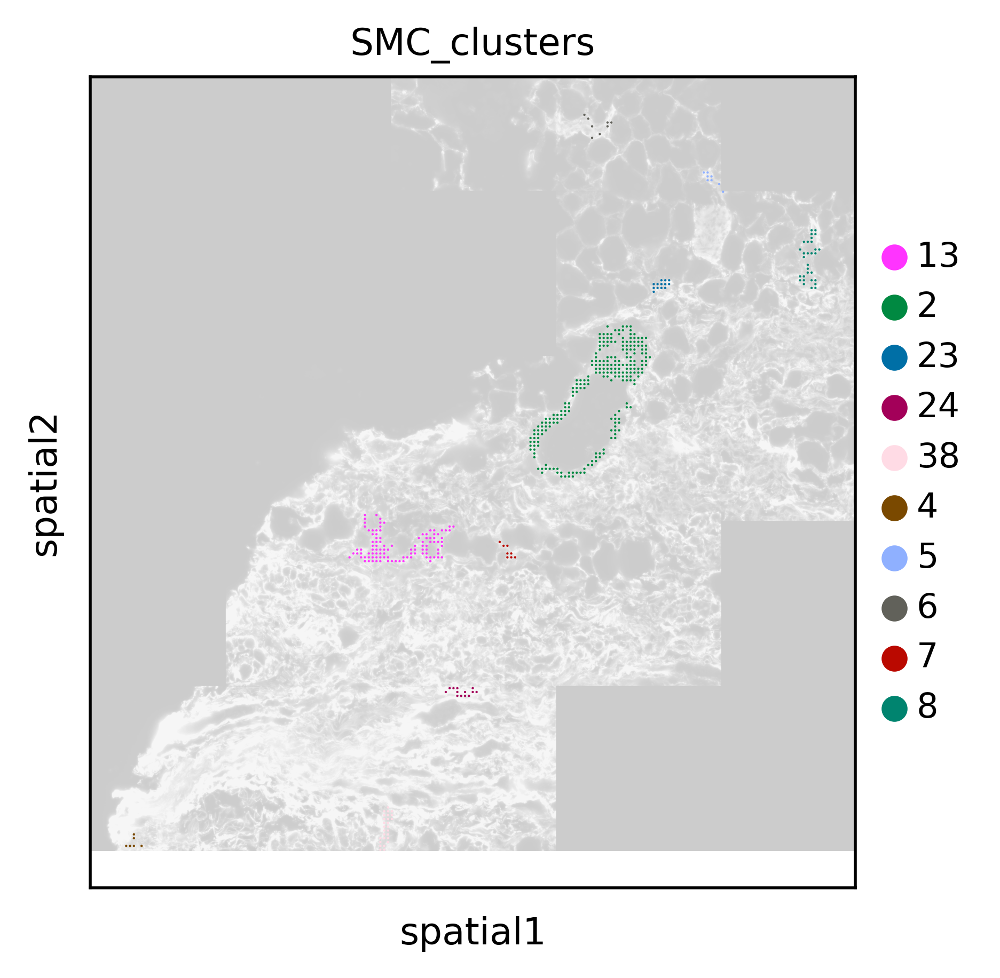

In [52]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2)

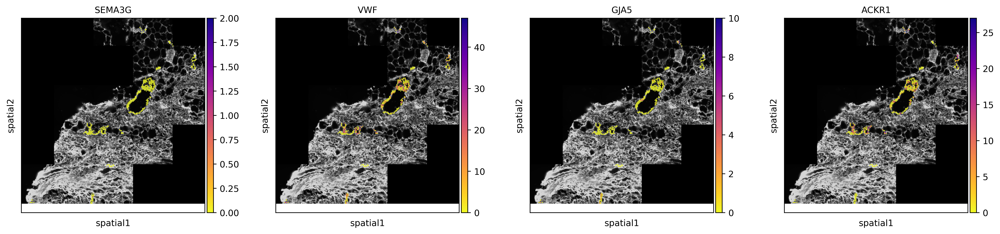

In [53]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5","ACKR1"],img_key='WGA',size=10, cmap = 'plasma_r')

In [54]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein


### add vessel size numbers

In [55]:
adata_aec_subset.obs.SMC_clusters.value_counts()

2     238
13    102
8      30
38     27
23     13
24     13
5       8
6       8
7       8
4       6
Name: SMC_clusters, dtype: int64

In [56]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [57]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [58]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein,102
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein,238
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,13
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear,13
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery,27
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery,6
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery,8
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein,8
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein,8


In [59]:
group=pd.Series("Large", index=test2.index)

In [60]:
group[test2["size"] <= 30] = "Small"

In [61]:
group

SMC_clusters
13    Large
2     Large
23    Small
24    Small
38    Small
4     Small
5     Small
6     Small
7     Small
8     Small
dtype: object

In [62]:
test2["group"] = group

In [63]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein,102,Large
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein,238,Large
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,13,Small
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear,13,Small
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery,27,Small
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery,6,Small
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery,8,Small
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein,8,Small
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein,8,Small


In [64]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [65]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein,102,Large,Vein_Large
2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein,238,Large,Vein_Large
23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,13,Small,Unclear_Small
24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear,13,Small,Unclear_Small
38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery,27,Small,Artery_Small
4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery,6,Small,Artery_Small
5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery,8,Small,Artery_Small
6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein,8,Small,Vein_Small
7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein,8,Small,Vein_Small


In [66]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [67]:
test2.index = ['ROI_C2-3_' + str(i) for i in test2.index.tolist()]

In [68]:
test2["ROI"] = "C2-3"

In [69]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_C2-3_13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein,102,Large,Vein_Large,C2-3
ROI_C2-3_2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein,238,Large,Vein_Large,C2-3
ROI_C2-3_23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,13,Small,Unclear_Small,C2-3
ROI_C2-3_24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear,13,Small,Unclear_Small,C2-3
ROI_C2-3_38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery,27,Small,Artery_Small,C2-3
ROI_C2-3_4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery,6,Small,Artery_Small,C2-3
ROI_C2-3_5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery,8,Small,Artery_Small,C2-3
ROI_C2-3_6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein,8,Small,Vein_Small,C2-3
ROI_C2-3_7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein,8,Small,Vein_Small,C2-3
ROI_C2-3_8,0.000000,0.666667,0.033333,0.066667,0.366667,0.033333,0.066667,NaN,3.200000,1.000000,3.909091,1.000000,NaN,7.210526,NaN,NaN,Vein,30,Small,Vein_Small,C2-3


[Text(0.5, 1.0, 'RERGL percentage expression')]

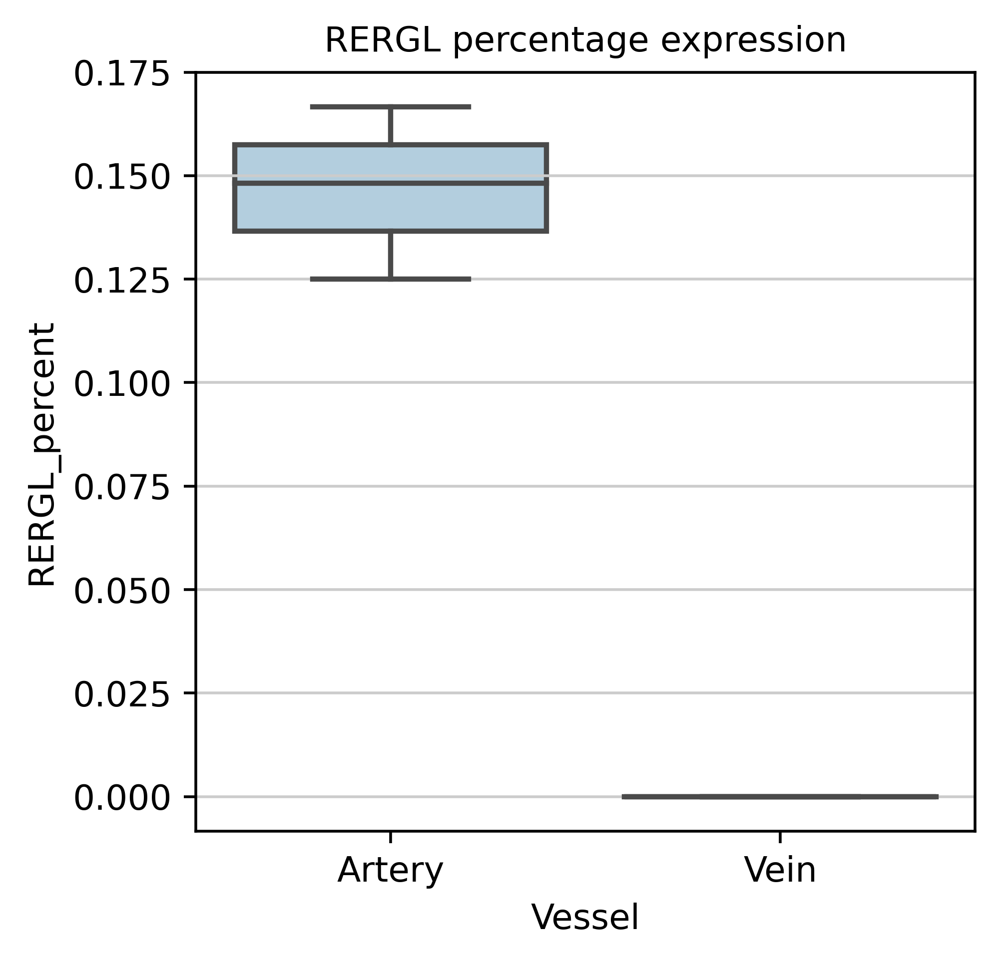

In [62]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

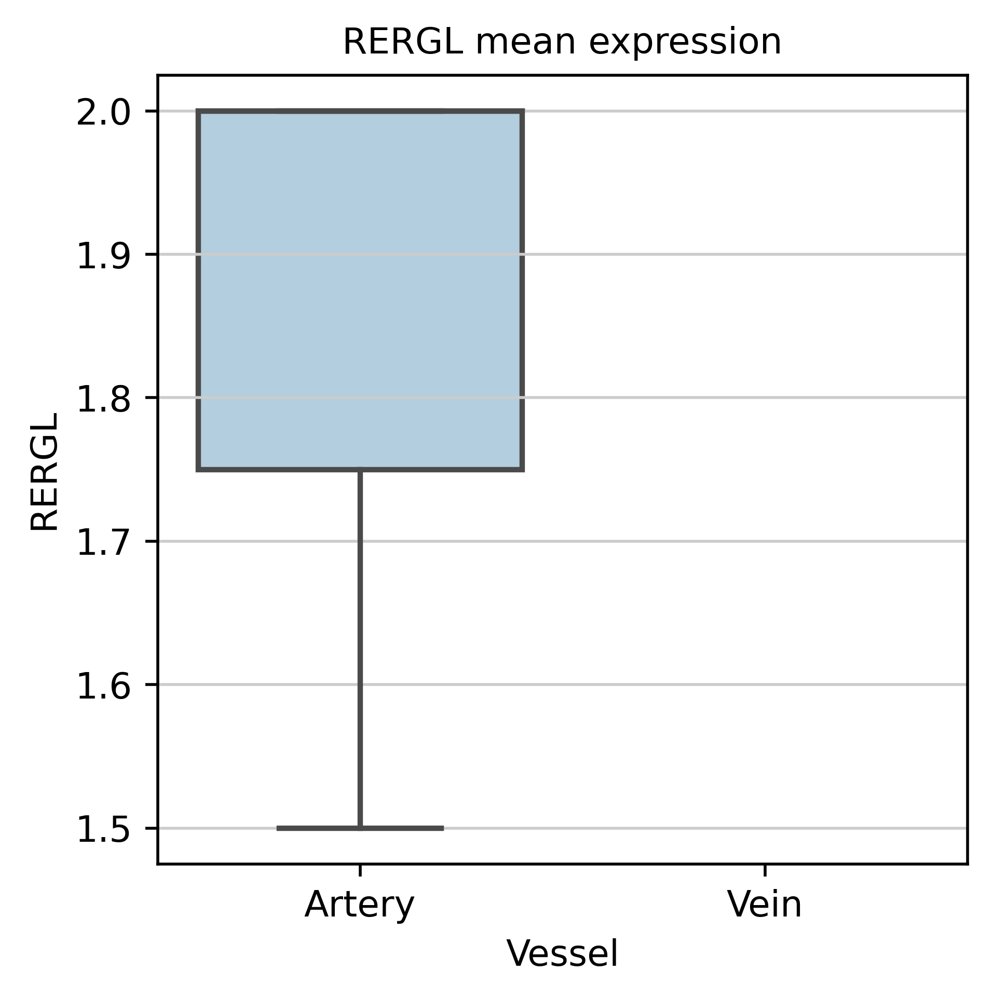

In [63]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

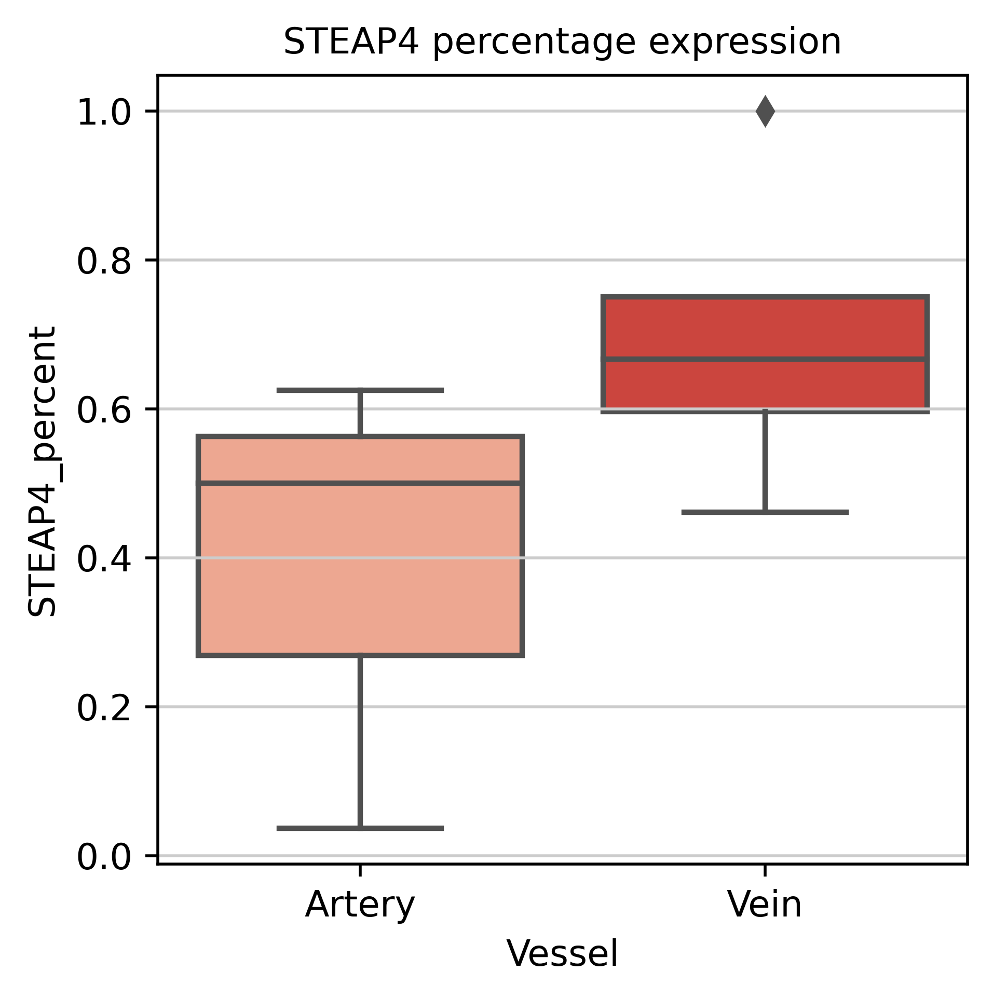

In [64]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

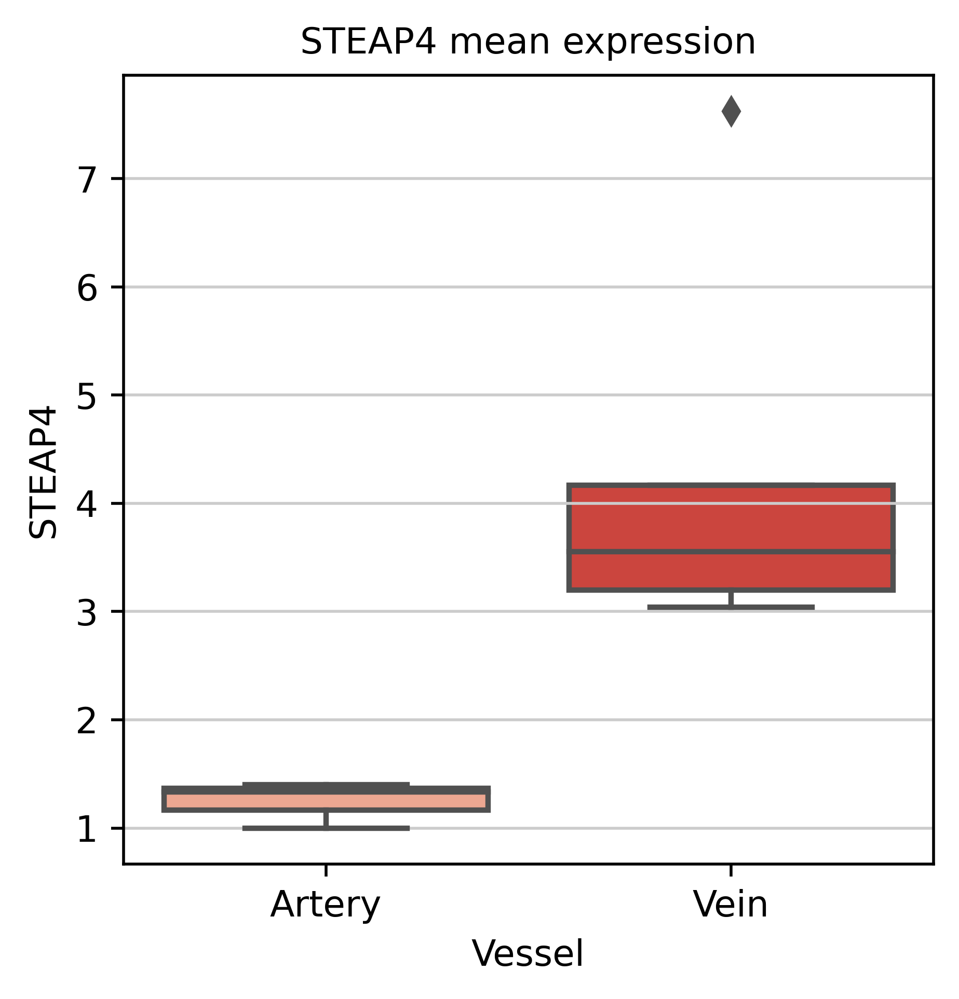

In [65]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

[Text(0.5, 1.0, 'KCNJ8 percentage expression')]

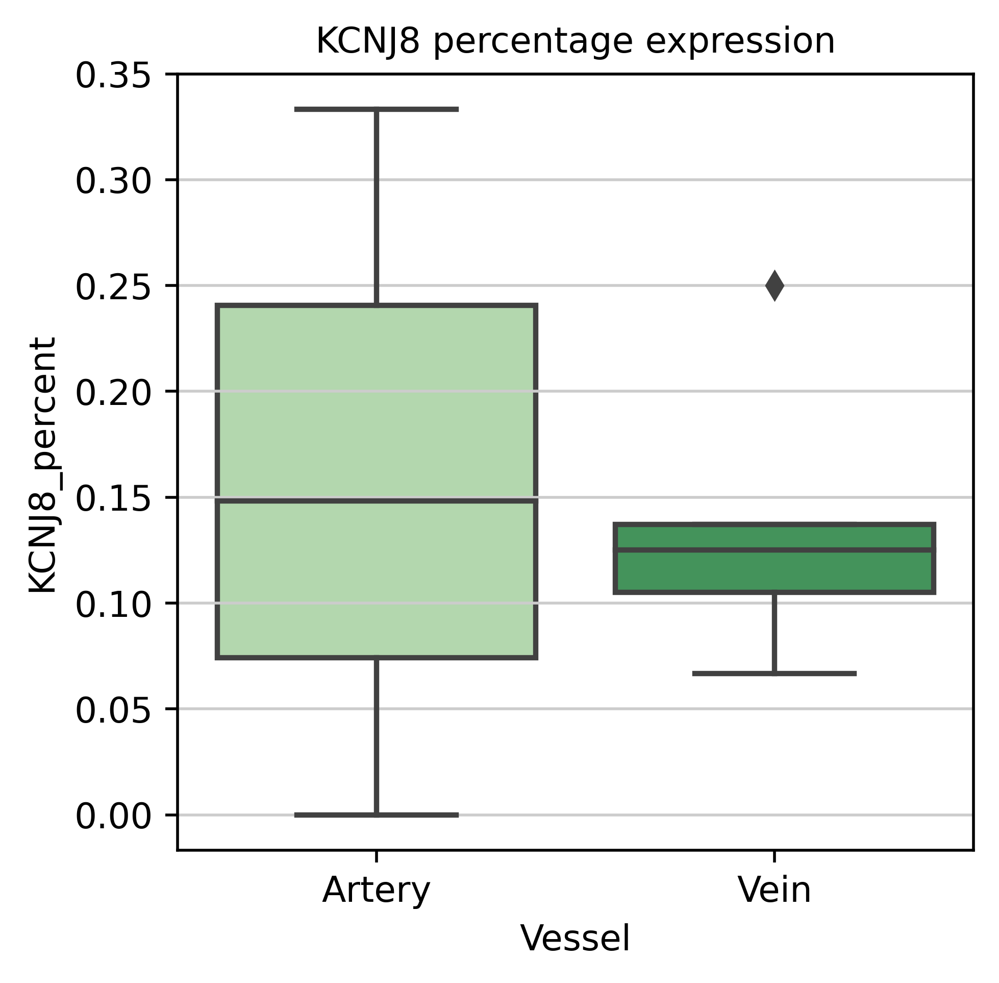

In [66]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8_percent", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 percentage expression')

[Text(0.5, 1.0, 'KCNJ8 mean expression')]

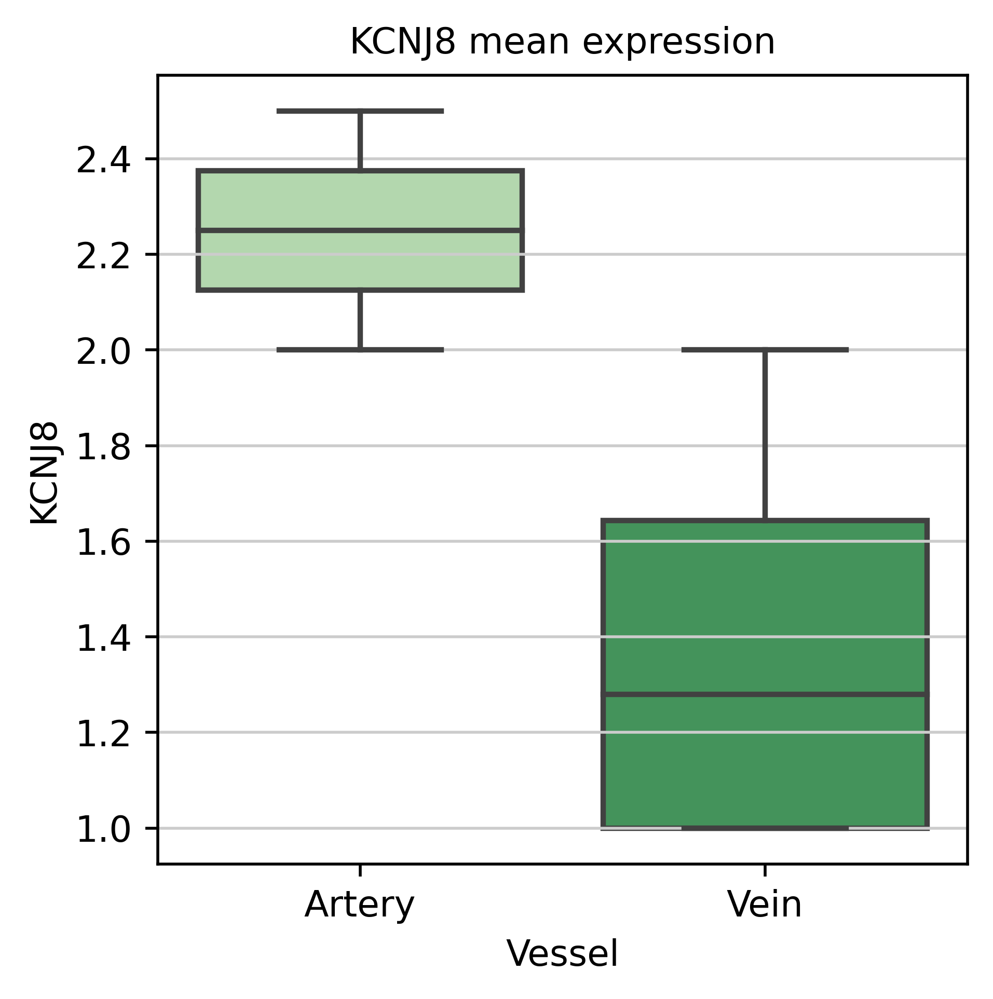

In [67]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 mean expression')

In [68]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_C2-3_13,0.000000,0.460784,0.088235,0.137255,0.382353,0.009804,0.049020,NaN,3.553191,1.111111,3.538461,1.642857,NaN,6.890909,1.250000,NaN,Vein,C2-3
ROI_C2-3_2,0.000000,0.596639,0.096639,0.105042,0.365546,0.054622,0.058824,NaN,3.042253,1.608696,2.436782,1.280000,NaN,4.118110,1.333333,NaN,Vein,C2-3
ROI_C2-3_23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,C2-3
ROI_C2-3_24,0.000000,0.076923,0.307692,0.000000,0.153846,0.000000,0.000000,NaN,1.000000,1.250000,1.500000,NaN,NaN,NaN,1.000000,NaN,Unclear,C2-3
ROI_C2-3_38,0.148148,0.037037,0.000000,0.148148,0.518519,0.000000,0.000000,1.5,1.000000,NaN,3.428571,2.000000,1.5,NaN,1.000000,NaN,Artery,C2-3
ROI_C2-3_4,0.166667,0.500000,0.000000,0.333333,0.333333,0.000000,0.000000,2.0,1.333333,NaN,2.500000,2.500000,NaN,NaN,2.000000,NaN,Artery,C2-3
ROI_C2-3_5,0.125000,0.625000,0.375000,0.000000,0.500000,0.000000,0.000000,2.0,1.400000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,Artery,C2-3
ROI_C2-3_6,0.000000,1.000000,0.375000,0.125000,0.375000,0.375000,0.125000,NaN,7.625000,2.000000,4.666667,2.000000,NaN,10.666667,1.000000,NaN,Vein,C2-3
ROI_C2-3_7,0.000000,0.750000,0.000000,0.250000,0.625000,0.000000,0.125000,NaN,4.166667,NaN,3.400000,1.000000,NaN,9.800000,NaN,NaN,Vein,C2-3
ROI_C2-3_8,0.000000,0.666667,0.033333,0.066667,0.366667,0.033333,0.066667,NaN,3.200000,1.000000,3.909091,1.000000,NaN,7.210526,NaN,NaN,Vein,C2-3


[Text(0.5, 1.0, 'STEAP4/KCNJ8 percent expression')]

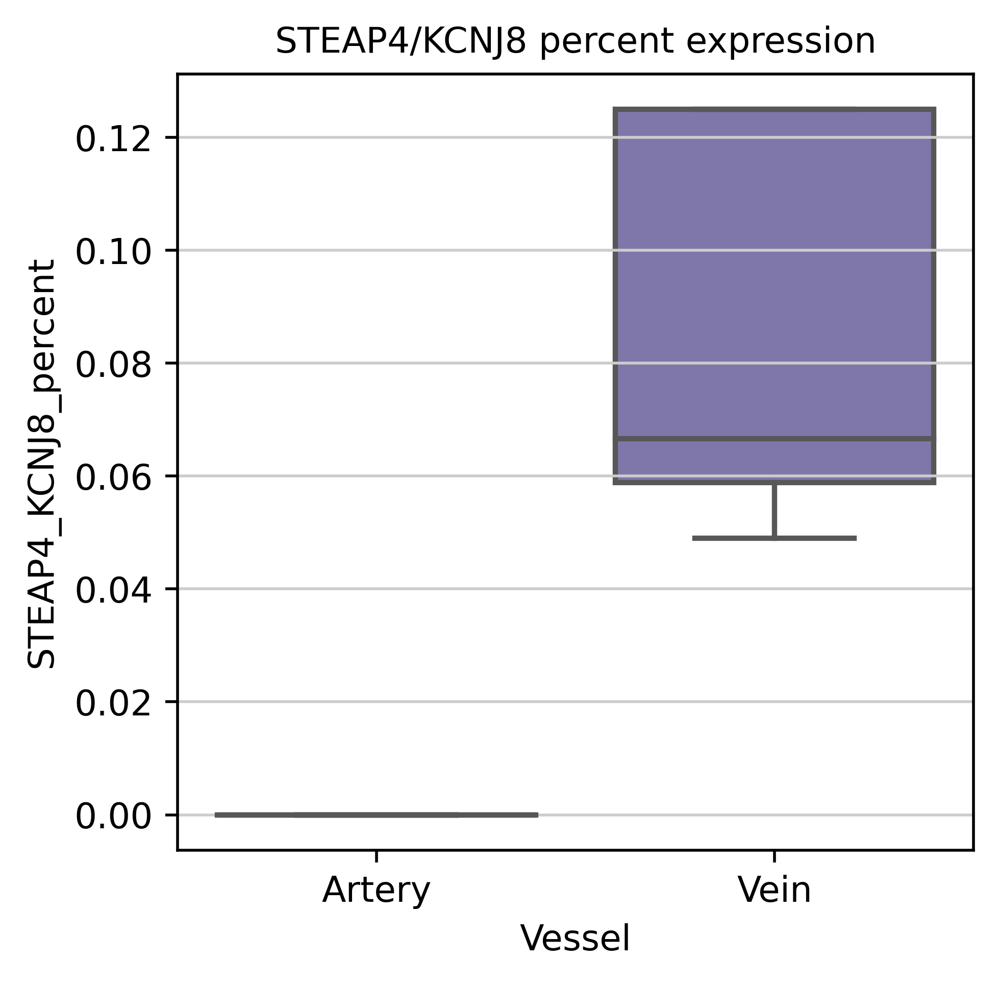

In [71]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_KCNJ8_percent", palette = 'Purples', order = ['Artery','Vein']).set(title='STEAP4/KCNJ8 percent expression')